In [1]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.animation import FuncAnimation
from hmm import HMM
from emission import GaussianEmission

np.set_printoptions(linewidth=100, suppress=True)

%matplotlib inline
plt.rcParams['animation.html'] = 'jshtml'

## Model setup

In [2]:
seed = 10

In [3]:
# model dimensions
N_STATE = 3

# true model to generate data
hmm_true = HMM(N_STATE, GaussianEmission(N_STATE))
hmm_true.gen_params(random_state=seed)

In [4]:
# stationary distribution to check no state is too rare
np.linalg.matrix_power(hmm_true.transition_mat, 1024)

array([[0.47542773, 0.27833207, 0.2462402 ],
       [0.47542773, 0.27833207, 0.2462402 ],
       [0.47542773, 0.27833207, 0.2462402 ]])

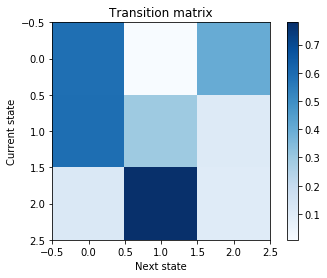

In [5]:
# heatmap of transition matrix
plt.imshow(hmm_true.transition_mat, cmap='Blues', interpolation='nearest')
plt.ylabel('Current state'); plt.xlabel('Next state'); plt.title('Transition matrix')
plt.colorbar();

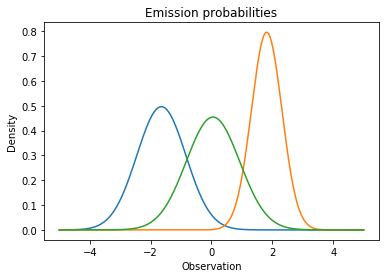

In [6]:
# heatmap of emission probabilities
x = np.linspace(-5, 5, 801)
for (mean, var) in hmm_true.emission_model.params:
    plt.plot(x, stats.norm(mean, np.sqrt(var)).pdf(x))
plt.xlabel('Observation');plt.ylabel('Density');plt.title('Emission probabilities');

## Decoding a sequence

In [7]:
# generate one sequence
SEQLEN = 500
data = hmm_true.random_seq(SEQLEN, random_state=seed)

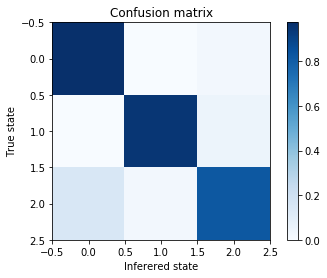

In [8]:
inferred = hmm_true.viterbi(data)

counts = np.zeros((N_STATE, N_STATE))
for t, i in zip(hmm_true.state_seq, inferred):
    counts[t,i] += 1

plt.imshow(counts / counts.sum(axis=1)[:,np.newaxis], cmap='Blues', interpolation='nearest')
plt.ylabel('True state')
plt.xlabel('Inferered state')
plt.title('Confusion matrix')
plt.colorbar();

It makes sense that the last state is the least accurately predicted, as its emission distribution overlaps with the other two states' emission distributions.

In [9]:
print('  '.join(('  Obs', 'True', 'Inferred')))
for obs, t, i in zip(data, hmm_true.state_seq, inferred):
    print(f'{obs:5.2f}{t:6}{i:10}')

  Obs  True  Inferred
-0.36     2         0
-1.79     0         0
 0.86     2         2
 1.93     1         1
-2.04     0         0
-1.72     0         0
-1.22     0         0
 0.53     2         2
 1.72     1         1
-1.01     0         0
 0.74     2         2
-0.38     2         0
-2.46     0         0
-1.38     0         0
 0.56     2         2
 1.58     1         1
 1.60     1         1
-1.22     0         0
 0.19     2         2
 2.49     1         1
-1.23     0         0
 0.27     0         2
-1.22     0         0
-0.74     2         2
 1.71     1         1
-1.72     0         0
-1.43     2         2
 2.15     1         1
 1.84     1         1
 1.80     1         1
 1.54     1         1
-2.54     0         0
-0.14     2         2
 1.37     1         1
-1.64     0         0
-2.38     0         0
-2.78     0         0
 0.13     2         2
-1.49     0         0
 0.53     2         2
 1.84     1         1
 2.55     1         1
-2.16     0         0
 1.02     2         2
 1.32     

## Parameter inference

In [10]:
# these objects have no access to the generated model parameters
hmm_fit = HMM(N_STATE, GaussianEmission(N_STATE, -5, 5, 0.25, 16))
hmm_fit.gen_params(random_state=seed+1)
logl, iter_params = hmm_fit.baum_welch(data, 200);

iterations: 50 98


In [11]:
# compare emission probabilities
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(14, 6))

l0 = []
l1 = []

ax = axes[0]
i = 0
for (mean, var) in hmm_true.emission_model.params:
    l0.append(ax.plot(x, stats.norm(mean, np.sqrt(var)).pdf(x), label=str(i))[0])
    i += 1
ax.set_xlabel('Observation');ax.set_ylabel('Density');ax.set_title('Original emission probabilities')
ax.set_ylim(-0.04, 1)
ax.legend()

ax = axes[1]
for (mean, var) in iter_params[0]:
    l1.append(ax.plot(x, stats.norm(mean, np.sqrt(var)).pdf(x))[0])
    ax.set_xlabel('Observation');ax.set_ylabel('Density');ax.set_title('Fitted emission probabilities')
ax.set_ylim(-0.04, 1)
    
ls = [l0, l1]

def update(idx):
    i = 0
    for (mean, var) in iter_params[idx]:
        l1[i].set_data(x, stats.norm(mean, np.sqrt(var)).pdf(x))
        i += 1
    return l1
        
ani = FuncAnimation(fig, update, frames=range(len(iter_params)), blit=True, interval=50)
plt.close()

ani

The colours above don't match up, but informs how to reshuffle the transition matrices.

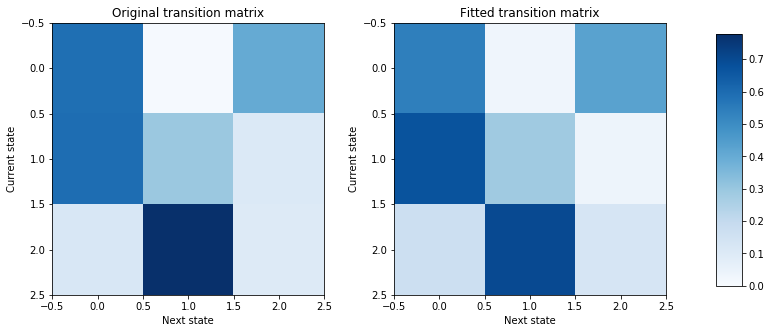

In [12]:
# compare transition matrices
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(12, 5))

perm = [1, 2, 0]
vmax = max(hmm_true.transition_mat.max(), hmm_fit.transition_mat.max())

ax = axes[0]
im = ax.imshow(hmm_true.transition_mat, cmap='Blues', interpolation='nearest', vmin=0, vmax=vmax)
ax.set_ylabel('Current state'); ax.set_xlabel('Next state'); ax.set_title('Original transition matrix')

ax = axes[1]
im = ax.imshow(hmm_fit.transition_mat[perm,:][:,perm], cmap='Blues', interpolation='nearest', vmin=0, vmax=vmax)
ax.set_ylabel('Current state'); ax.set_xlabel('Next state'); ax.set_title('Fitted transition matrix')

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
fig.colorbar(im, cax=cbar_ax);

## Multiple runs

In [13]:
results = []
for run in range(1, 11):
    hmm_fit = HMM(N_STATE, GaussianEmission(N_STATE))
    hmm_fit.gen_params(random_state=seed+run)
    res = hmm_fit.baum_welch(data, 200)
    results.append((*res, hmm_fit))

iterations: 50 100 108
iterations: 50 59
iterations: 50 100 107
iterations: 50 75
iterations: 50 75
iterations: 50 71
iterations: 50 86
iterations: 50 93
iterations: 50 82
iterations: 50 72


In this case the results are very similar, probably because of the little overlap between emission distributions.

In [14]:
# log likelihoods
[r[0] for r in results]

[-809.7455450220938,
 -809.7455450220928,
 -809.7455450220896,
 -809.7455450220887,
 -809.7455450220849,
 -809.7455450220887,
 -809.7455450220853,
 -809.7455450220909,
 -809.7455450220876,
 -809.7455450220976]

In [15]:
best = max(results)

In [16]:
# compare emission probabilities
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(14, 6))

l0 = []
l1 = []

ax = axes[0]
i = 0
for (mean, var) in hmm_true.emission_model.params:
    l0.append(ax.plot(x, stats.norm(mean, np.sqrt(var)).pdf(x), label=str(i))[0])
    i += 1
ax.set_xlabel('Observation');ax.set_ylabel('Density');ax.set_title('Original emission probabilities')
ax.set_ylim(-0.04, 1)
ax.legend()

ax = axes[1]
for (mean, var) in best[1][0]:
    l1.append(ax.plot(x, stats.norm(mean, np.sqrt(var)).pdf(x))[0])
    ax.set_xlabel('Observation');ax.set_ylabel('Density');ax.set_title('Fitted emission probabilities')
ax.set_ylim(-0.04, 1)
    
ls = [l0, l1]

def update(idx):
    i = 0
    for (mean, var) in best[1][idx]:
        l1[i].set_data(x, stats.norm(mean, np.sqrt(var)).pdf(x))
        i += 1
    return l1
        
ani = FuncAnimation(fig, update, frames=range(len(best[1])), blit=True, interval=50)
plt.close()

ani

The colours above don't match up, but informs how to reshuffle the transition matrices.

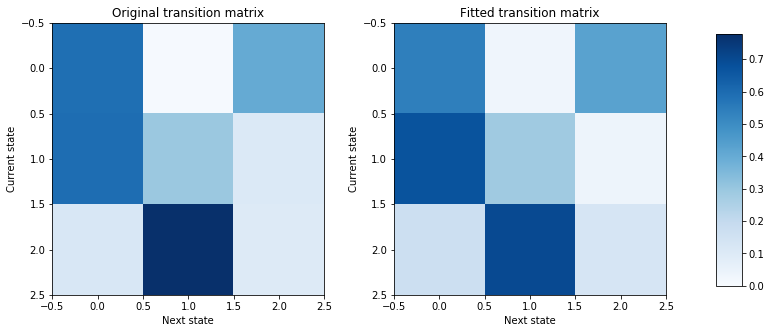

In [17]:
# compare transition matrices
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(12, 5))

perm = [0, 2, 1]
vmax = max(hmm_true.transition_mat.max(), best[2].transition_mat.max())

ax = axes[0]
im = ax.imshow(hmm_true.transition_mat, cmap='Blues', interpolation='nearest', vmin=0, vmax=vmax)
ax.set_ylabel('Current state'); ax.set_xlabel('Next state'); ax.set_title('Original transition matrix')

ax = axes[1]
im = ax.imshow(best[2].transition_mat[perm,:][:,perm], cmap='Blues', interpolation='nearest', vmin=0, vmax=vmax)
ax.set_ylabel('Current state'); ax.set_xlabel('Next state'); ax.set_title('Fitted transition matrix')

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
fig.colorbar(im, cax=cbar_ax);